[Model Link](https://huggingface.co/facebook/detr-resnet-50)

## Downloading Dependencies

In [ ]:
!pip install --upgrade transformers

# Using Hugging Face Model

## Logging Into Hugging Face Hub

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

## Using Pipeline

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("object-detection", model="facebook/detr-resnet-50")

In [ ]:
from PIL import Image

image_path = "./room.jpg"
image = Image.open(image_path)

In [ ]:
detections = pipe(image)
detections

[{'score': 0.9961563944816589,
  'label': 'bottle',
  'box': {'xmin': 1416, 'ymin': 1339, 'xmax': 1669, 'ymax': 2222}},
 {'score': 0.9748237729072571,
  'label': 'book',
  'box': {'xmin': 1550, 'ymin': 1996, 'xmax': 3018, 'ymax': 3967}}]

In [ ]:
from PIL import ImageDraw, ImageFont
import random

def draw_boxes(image, detections):
    unique_labels = list(set(d['label'] for d in detections))
    colors = {label: (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for label in unique_labels}

    draw = ImageDraw.Draw(image)

    # Font for label and score
    font = ImageFont.load_default()

    # Draw boxes, labels, and scores
    for detection in detections:
        box = detection['box']
        label = detection['label']
        score = detection['score']
        color = colors[label]

        # Draw rectangle
        draw.rectangle([(box['xmin'], box['ymin']), (box['xmax'], box['ymax'])], outline=color, width=10)

        # Prepare text
        label_score_text = f"{label}: {score:.2f}"

        # Draw text background
        text_size = draw.textsize(label_score_text, font=font)
        draw.rectangle([box['xmin'], box['ymin'] - text_size[1], box['xmin'] + text_size[0], box['ymin']], fill=color)

        # Draw text
        draw.text((box['xmin'], box['ymin'] - text_size[1]), label_score_text, fill='white', font=font)
    
    return image

/var/folders/g1/zlrqg2nj6xz42rpkl65b1h_40000gn/T/ipykernel_74678/3849551991.py:27: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_size = draw.textsize(label_score_text, font=font)
/var/folders/g1/zlrqg2nj6xz42rpkl65b1h_40000gn/T/ipykernel_74678/3849551991.py:27: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_size = draw.textsize(label_score_text, font=font)


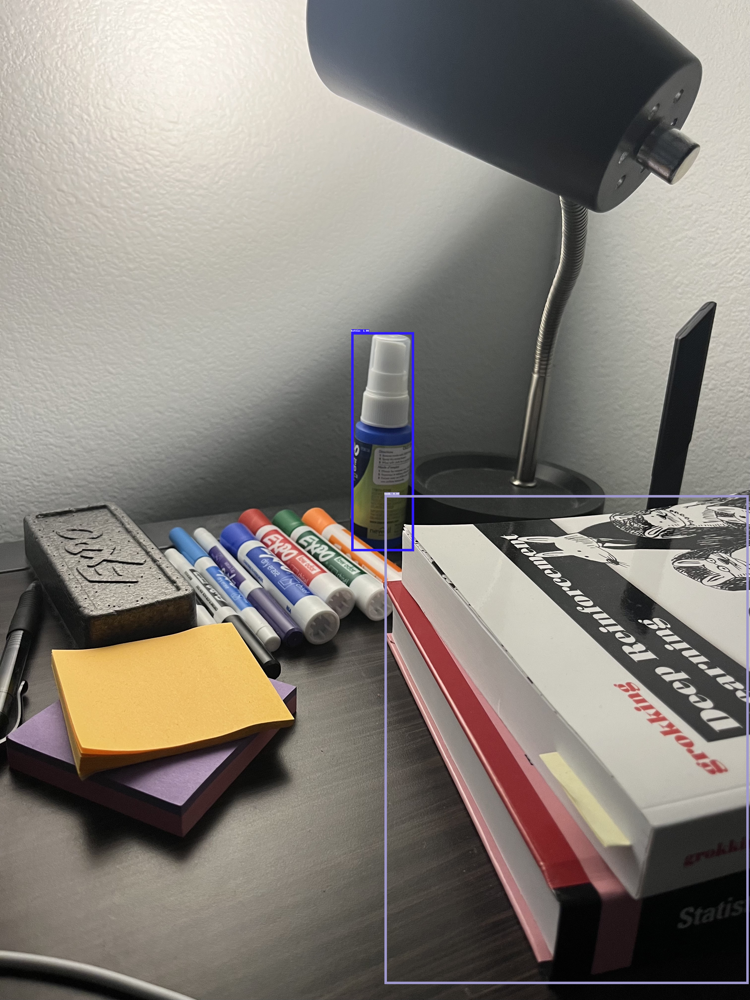

In [ ]:
display(draw_boxes(image, detections))